In [1]:
import re 
import json
import nltk 
import string 
import multiprocessing
import numpy as np
import pandas as pd
from nltk.stem.porter import *
from collections import Counter
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook
from nltk.corpus import stopwords 
from nltk.stem import WordNetLemmatizer 
lemmatizer = WordNetLemmatizer() 
from nltk.tokenize import word_tokenize
from wordcloud import WordCloud, STOPWORDS
np.random.seed(2018)
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_colwidth', -1)
pd.set_option('display.float_format', lambda x: '%.3f' % x)
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
plt.style.use('classic')
%matplotlib inline
s=12

__author__ = 'HK Dambanemuya'
__version__ = 'Python2'

In [2]:
df = pd.read_csv("../../Data/Fusion/news.csv")

In [3]:
stop_words = stopwords.words("english")
stop_words.extend(['coronavirus', 'covid', 'virus', 'news', 'new', 'outbreak', 'pandemic'])

In [4]:
# convert to lowercase
def text_lowercase(text): 
    return text.decode('ascii', 'ignore').lower() 

# remove numbers
def remove_numbers(text): 
    result = re.sub(r'\d+', '', text.encode('ascii', 'ignore')) 
    return result 

# remove whitespace from text 
def remove_whitespace(text): 
    return  " ".join(text.encode('ascii', 'ignore').split())

# remove stopwords 
def remove_stopwords(text): 
    word_tokens = word_tokenize(text.encode('ascii', 'ignore')) 
    filtered_text = [word for word in word_tokens if word not in stop_words] 
    return filtered_text 

# pre-process text
def pre_process(text):
    text_lower = text_lowercase(str(text).decode('ascii', 'ignore'))
    no_numbers = remove_numbers(text_lower)
    no_punctuation = no_numbers.translate(None, string.punctuation)
    no_whitespace = remove_whitespace(no_punctuation)
    no_stopwords = remove_stopwords(no_whitespace)
    lemmas = [lemmatizer.lemmatize(token) for token in no_stopwords]
    no_chars = [i for i in lemmas if len(i) > 1]
    return no_chars   

# get bi-grams
def bi_grams(tokens):
    return list(nltk.bigrams(tokens))

In [5]:
pool = multiprocessing.Pool(processes=8)

In [6]:
titles = pool.map(pre_process, df['title'].dropna())

In [7]:
words = [element for lis in titles for element in lis]

In [8]:
print Counter(words).most_common(100) 

[(u'case', 128808), ('china', 110420), (u'say', 86194), ('amid', 85383), ('test', 62656), ('health', 61404), ('trump', 61091), ('due', 60577), ('home', 55977), ('business', 55100), ('death', 54890), ('spread', 50335), ('update', 49787), (u'fear', 48267), ('positive', 48202), ('first', 47722), ('state', 46250), ('world', 44756), ('market', 43386), (u'day', 42933), (u'stock', 42427), (u'school', 42422), ('close', 41972), ('report', 41167), ('people', 39542), ('time', 38233), ('help', 38136), ('crisis', 37771), ('lockdown', 35804), ('travel', 34430), (u'county', 33401), ('march', 33262), ('response', 32676), ('hospital', 31746), ('emergency', 31728), (u'concern', 31705), ('could', 31512), ('week', 31474), ('hit', 31152), (u'worker', 31012), ('quarantine', 30839), ('global', 30478), ('fight', 30468), ('call', 29049), ('uk', 29016), ('get', 28570), ('city', 28380), (u'patient', 27292), (u'take', 27226), (u'plan', 26956), ('official', 26779), ('rise', 26653), ('public', 26201), ('government'

In [9]:
grams_collection = pool.map(bi_grams, titles)

In [10]:
topics = []
for grams in tqdm_notebook(grams_collection):
    topics.extend(grams)

In [11]:
len(titles), len(topics)

(2297047, 13701192)

### Save Discussion Topics to File

In [12]:
top_1k = Counter(topics).most_common(1000)

In [13]:
# n1k = [i[0] for i in top_1k]

In [17]:
with open('../../Reloaded/Data/topics_n.csv', 'w') as f:
    f.write(json.dumps(top_1k))

### Visualize Topics

In [15]:
wordcloud = WordCloud(stopwords=stop_words, max_font_size=24, max_words=100, background_color="white").generate(string.join(words))

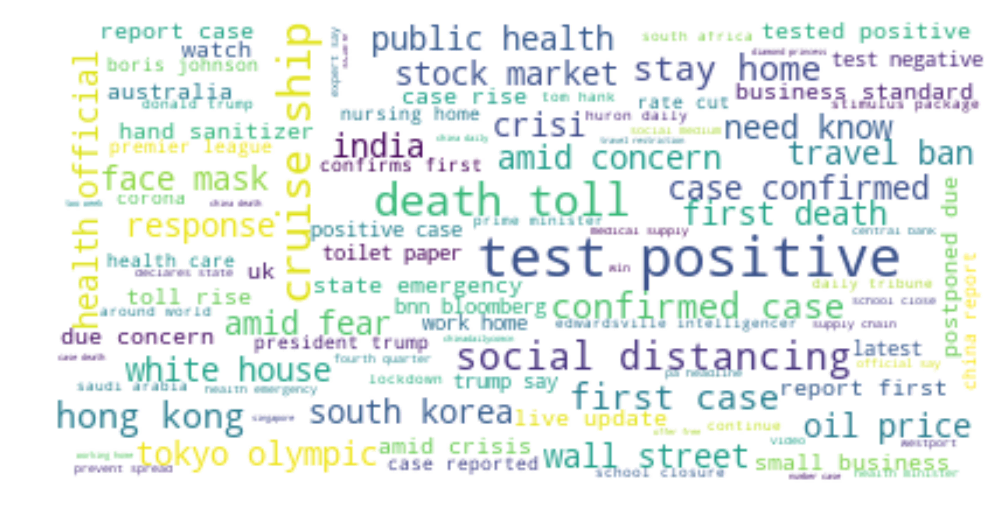

In [16]:
plt.figure(figsize=(8, 5), dpi=1080)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout()
plt.show()